# Quick Start (Square Bin)

In this case, we use spatial expression matrix of bin1(bin_size is defined beblow) in the mouse brain generated by Stereo-seq for downstream analysis.

<div class="alert alert-info">

**Note**

Download the notebook of [**Quick Start**](https://github.com/STOmics/stereopy/blob/main/docs/source/Tutorials/clustering.ipynb). You can download all notebooks of Stereopy-tutorial on [**Github**](https://github.com/STOmics/stereopy).

</div>

## Introduction of Raw Data

#### GEM and GEF

There are two types of Stereo-seq data, GEM and GEF. The format of original expression matrix of GEM file is as follows: x, y are the spatial position of the gene in tissue section, and MIDCount is the number of gene expression. ExonCount is the number of exons expression only in GEM file, which is generated by `spatial_RNA_visualization_v5` in SAP or SAW (version >= 5.1.3).

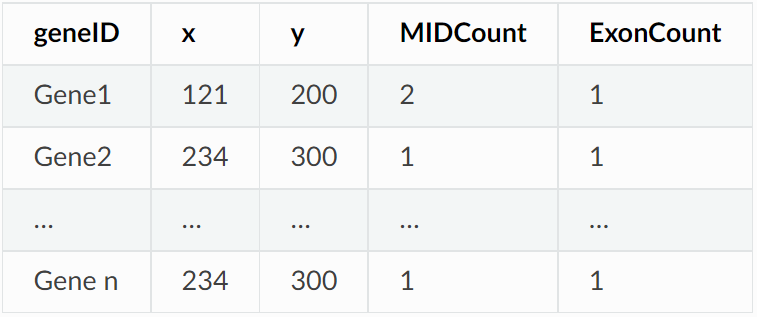

More information of GEF file is in the [**format documentation**](https://www.processon.com/view/link/610cc49c7d9c087bbd1ab7ab#map). Usually, we recommend using GEF format of which reading speed is much faster than GEM.

#### Bin_size

The resolution of Stereo-seq technology is up to nanometer level, where nanopore radius of bin1 is 250 nm.

Generally, **bin_size** parameter is set to combine the nanopores within a certain range into a `bin unit`. For instance, the side length of the bin unit is approximately 10 or 14 microns when **bin_size** is set to 20, according to different center-to-center distances, like 500 nm or 715 nm.

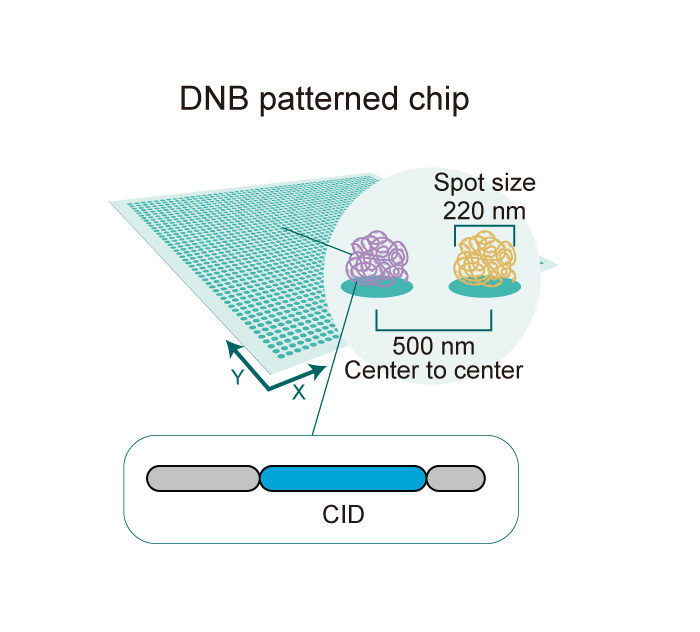

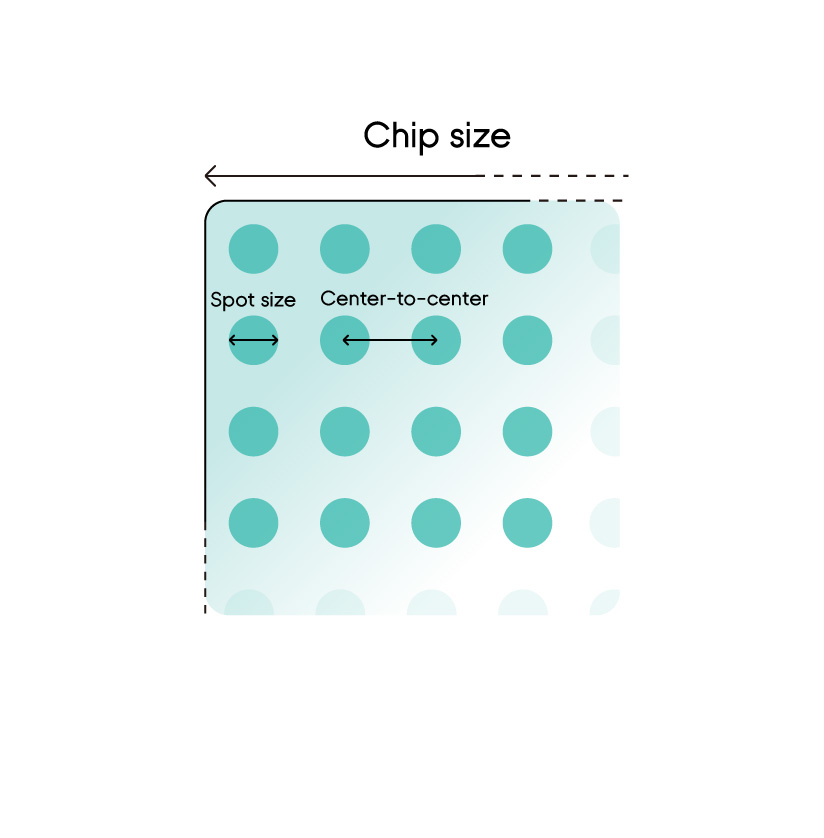

After the combination according to a certain **bin_size**, we will uniformly generate data into the format of StereoExpData.

#### Performance

At the end of this part, we display the running [**performance**]((https://stereopy.readthedocs.io/en/latest/Tutorials/performance.html)) of different bin_sizes to those who are handling mass data and more concerned about computational performance. Welcome to come back here after having finished this example. Also, similar performing tests come up elsewhere in Stereopy. 

## Reading data

Firstly, download our [**example data**](https://pan.genomics.cn/ucdisk/s/BvIrye) and import Stereopy.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
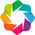

In [1]:
import stereo as st
import warnings
warnings.filterwarnings('ignore')

Get attributes of the GEF file.

In [2]:
data_path = './SS200000135TL_D1.tissue.gef'
st.io.read_gef_info(data_path)

[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1015][INFO]: This is GEF file which contains traditional bin infomation.
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1016][INFO]: bin_type: bins
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1019][INFO]: Bin size list: ['bin1']
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1025][INFO]: Resolution: 500
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1028][INFO]: Gene count: 20816
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1037][INFO]: offsetX: 0
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1040][INFO]: offsetY: 2
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1043][INFO]: Width: 13441
[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][1046][INFO]: Height: 19774
[2023-06-02 10:34:31][Stereo][22522

{'bin_list': ['bin1'],
 'resolution': 500,
 'gene_count': 20816,
 'offsetX': 0,
 'offsetY': 2,
 'width': 13441,
 'height': 19774,
 'maxExp': 14}

Load data to generate a StereoExpData object.

In [3]:
data = st.io.read_gef(file_path=data_path, bin_size=50)

# simply type the varibale to get related information
data

[2023-06-02 10:34:31][Stereo][22522][MainThread][139765435148096][reader][892][INFO]: read_gef begin ...


path:./data/SS200000135TL_D1.tissue.gef bin:50


[2023-06-02 10:34:39][Stereo][22522][MainThread][139765435148096][reader][979][INFO]: the matrix has 35890 cells, and 20816 genes.


               generateBinInfo - 13.850000 cpu sec


[2023-06-02 10:34:39][Stereo][22522][MainThread][139765435148096][reader][987][INFO]: read_gef end.


StereoExpData object with n_cells X n_genes = 35890 X 20816
bin_type: bins
bin_size: 50
offset_x = 0
offset_y = 2
cells: ['cell_name']
genes: ['gene_name']

##  Preprocessing

Data preprocessing includes three modules: quality control, filtering and normalization.

#### Quality Control

This module calculates the quality distribution of original data, using three indicators:

    total_counts - the total counts per cell;

    n_genes_by_counts - the number of genes expressed in count maxtrix;

    pct_countss_mt - the percentage of counts in mitochondrial genes.

In [4]:
data.tl.cal_qc()

[2023-06-02 10:34:39][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run cal_qc...
[2023-06-02 10:34:39][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: cal_qc end, consume time 0.2182s.


Show the violin figure of QC distribution.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

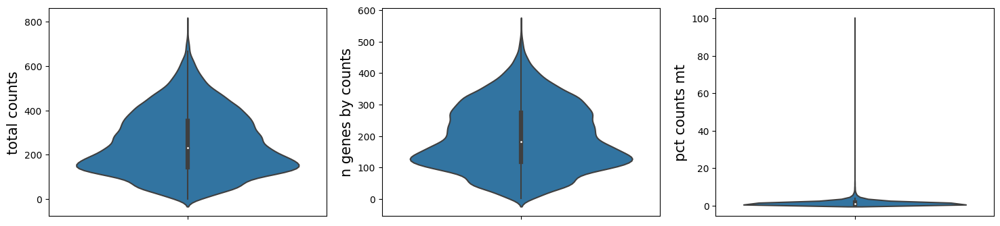

In [5]:
data.plt.violin()

<div class="alert alert-info">

**Note**

Just input your file name and click the download button to save visualization result, or set parameter in plot functions.

</div>

Show the spatial scatter figure of QC distribution.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

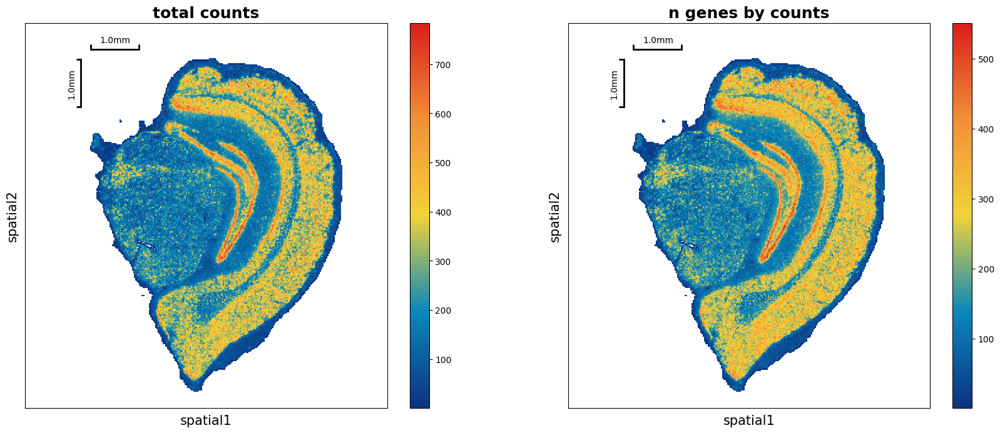

In [6]:
data.plt.spatial_scatter()

#### Filtering 

Three basic methods are provided to filter data maxtrix:

`data.tl.filter_cells`,
`data.tl.filter_genes`,
`data.tl.filter_coordinates`.

Literally, you could filter data on three optional levels: cell, gene and coordinate where a `bin unit` could be treated as a made-up cell provisionally.

We filter `bin units` (**bin_size** is set to 50 at the beginning of our example) based on quality control indicators which have been calculated in QC part. Beforehand, observe the distribution of cells according to scatter plots.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

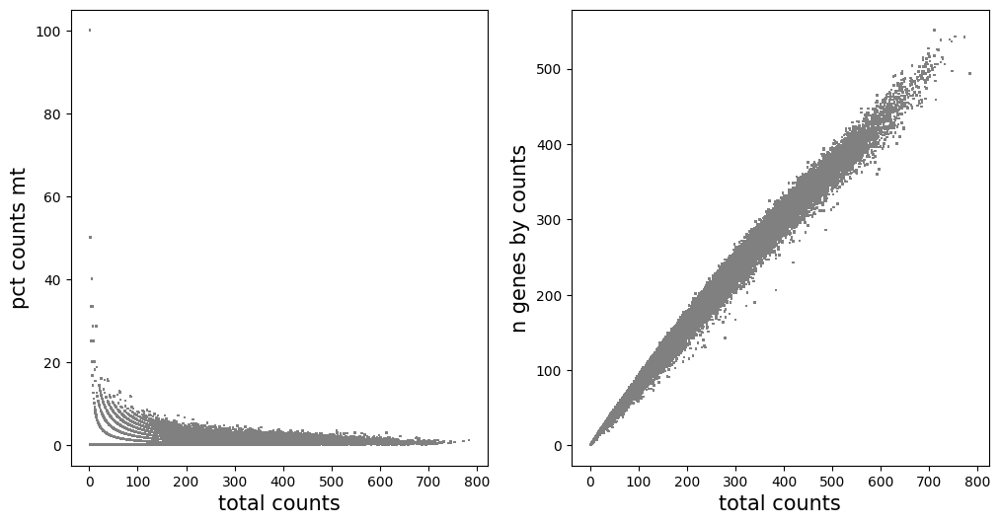

In [7]:
data.plt.genes_count()

Remove cells that have too many mitochondrial genes expressed, as well as cells without enough counts and genes expressed.

In [8]:
data.tl.filter_cells(
        min_gene=20, 
        min_n_genes_by_counts=3, 
        pct_counts_mt=5, 
        inplace=True
        )
data

[2023-06-02 10:34:42][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run filter_cells...
[2023-06-02 10:34:43][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: filter_cells end, consume time 0.3010s.


StereoExpData object with n_cells X n_genes = 34780 X 20816
bin_type: bins
bin_size: 50
offset_x = 0
offset_y = 2
cells: ['cell_name', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']

<div class="alert alert-info">

**Note**

We strongly suggest to use `self.raw` to record the raw gene expression matrix which has been gone through basic processing, as an essential data set for subsequent differential testing and multiple analysis.

</div>

So in order to save the data and recall it conveniently, you can save the raw expression matrix by `data.tl.raw_checkpoint()`. 

In [9]:
data.tl.raw_checkpoint()

In [10]:
data.tl.raw

StereoExpData object with n_cells X n_genes = 34780 X 20816
bin_type: bins
bin_size: 50
offset_x = 0
offset_y = 2
cells: ['cell_name', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']

<div class="alert alert-info">

**Note**

When you want to get raw data, just run `data.tl.reset_raw_data()`.

</div>

#### Normalization

In this module, you can choose from following common methods of standardization:

- [normalize_total](https://www.nature.com/articles/nbt.3192)
- [log1p](https://academic.oup.com/bioinformatics/article/37/15/2223/6155989)
- scale
- [scTransform](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1874-1)
- [quantile](https://github.com/panjie-payne/test-sphinx/blob/master/docs/source/_static/quantile.pdf)
    

<div class="alert alert-info">

**Note**

If the parameter `inplace` is set to `True` by default, expression matrix data will be replaced by the corresponding result (here replaced by the normalized result), otherwise unchanged.

</div>

Run a combination method of `normalize_total` and `log1p` to normalize gene expression matrix as below:

In [11]:
# inplace is set to True by default

data.tl.normalize_total(target_sum=10000)
data.tl.log1p()

[2023-06-02 10:34:43][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run normalize_total...
[2023-06-02 10:34:43][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: normalize_total end, consume time 0.0987s.
[2023-06-02 10:34:43][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run log1p...
[2023-06-02 10:34:43][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: log1p end, consume time 0.1003s.


If you use `data.tl.sctransform` which includes the function of finding highly variable genes, you do not need to run `data.tl.highly_variable_genes`. In the subsequent `data.tl.pca` method, the parameter `use_highly_genes` has to be set as `False`. In brief, whether to use highly variable genes to run PCA depends on `filter_hvgs` in the normalization of scTransform. Learn more about [scTransform](https://github.com/STOmics/stereopy/blob/main/docs/source/Tutorials/sctransform.ipynb).

#### Highly variable genes

Identify highly variable genes in cells.

In [12]:
data.tl.highly_variable_genes(
        min_mean=0.0125,
        max_mean=3,
        min_disp=0.5,
        n_top_genes=2000, 
        res_key='highly_variable_genes'
        ) 

[2023-06-02 10:34:43][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run highly_variable_genes...
[2023-06-02 10:34:44][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: highly_variable_genes end, consume time 0.7549s.


If `data.tl.scale(zero_center=False)` is used, sparse matrix will be used for calculation, which can greatly reduce the memory required for running.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

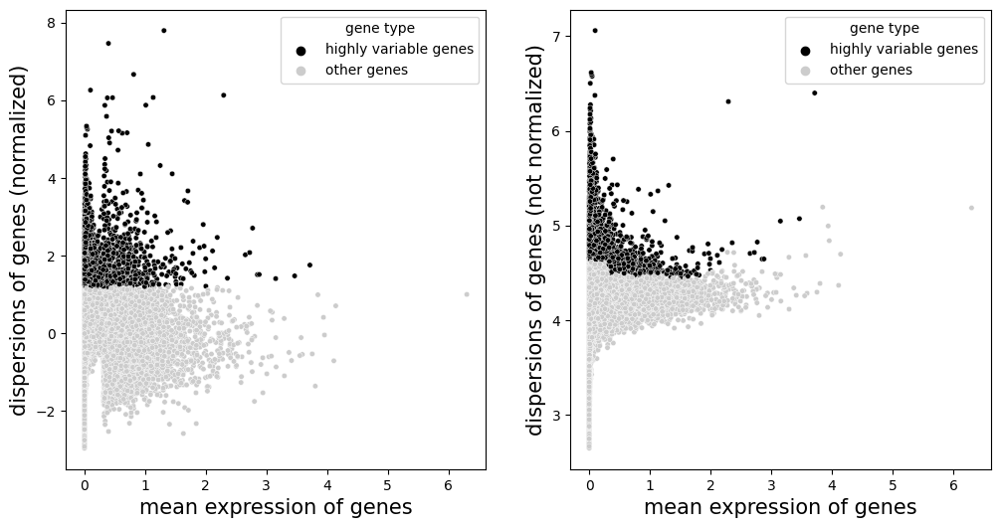

In [13]:
# remember to choose a res_key when plot

data.plt.highly_variable_genes(res_key='highly_variable_genes')

Scale each gene to unit variance. Clip values exceeding standard deviation 10. If `data.tl.scale(zero_center=False)` is used, sparse matrix will be used for calculation, which can greatly reduce the memory required for running.

In [14]:
data.tl.scale(max_value=10, zero_center=True)

[2023-06-02 10:34:45][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run scale...
[2023-06-02 10:34:58][Stereo][22522][MainThread][139765435148096][scale][52][INFO]: Truncate at max_value 10
[2023-06-02 10:34:59][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: scale end, consume time 13.9610s.


## Embedding

#### PCA (Principal component analysis)

As a statistical technique for reducing dimensionality of a data set, PCA finds the max axes of greatest variation, which preserve as much information as possible. Notice that if set parameter `use_highly_genes` to `True`, only highly variable genes are used to run.

In [15]:
data.tl.pca(
        use_highly_genes=False, 
        n_pcs=30, 
        res_key='pca'
        )

[2023-06-02 10:34:59][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run pca...
[2023-06-02 10:35:15][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: pca end, consume time 16.3076s.


When the parameter `res_key` arises, the corresponding result will be **stored automatically**, simply check:

In [16]:
data.tl.key_record

{'hvg': ['highly_variable_genes'],
 'pca': ['pca'],
 'neighbors': [],
 'umap': [],
 'cluster': [],
 'marker_genes': []}

#### Neighborhood graph 

After PCA, we compute the neighborhood graph of cells using the PCA representation of the expression matrix.

In [ ]:
data.tl.neighbors(
        pca_res_key='pca', 
        n_pcs=30, 
        res_key='neighbors'
        )

# compute spatial neighbors 
data.tl.spatial_neighbors(
        neighbors_res_key='neighbors',
        res_key='spatial_neighbors'
        )

[2023-03-29 15:31:49][Stereo][25381][MainThread][139692911236928][st_pipeline][35][INFO]: start to run neighbors...
2023-03-29 15:32:00.873290: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: ./software/lib:./software/lib64:./software/app/hdf5-1.12.1/lib:/opt/gridengine/lib/lx-amd64
2023-03-29 15:32:00.873372: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
[2023-03-29 15:36:36][Stereo][25381][MainThread][139692911236928][st_pipeline][38][INFO]: neighbors end, consume time 287.3766s.
[2023-03-29 15:36:36][Stereo][25381][MainThread][139692911236928][st_pipeline][35][INFO]: start to run spatial_neighbors...
[2023-03-29 15:37:57][Stereo][25381][MainThread][139692911236928][reader][596][INFO]: Adding sample in adata.obs['orig.ident'].
[2023

In addition, we also provide `data.tl.spatial_neighbors` to compute a spatial neighbors graph.

#### UMAP

It's strongly to suggest embedding the graph in two dimensions using UMAP.

In [18]:
data.tl.umap(pca_res_key='pca', neighbors_res_key='neighbors', res_key='umap')

[2023-06-02 10:36:39][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run umap...


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


[2023-06-02 10:36:55][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: umap end, consume time 16.4280s.


Plot the umap result of two genes: **Atpif1** and **Tmsb4x**. 

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

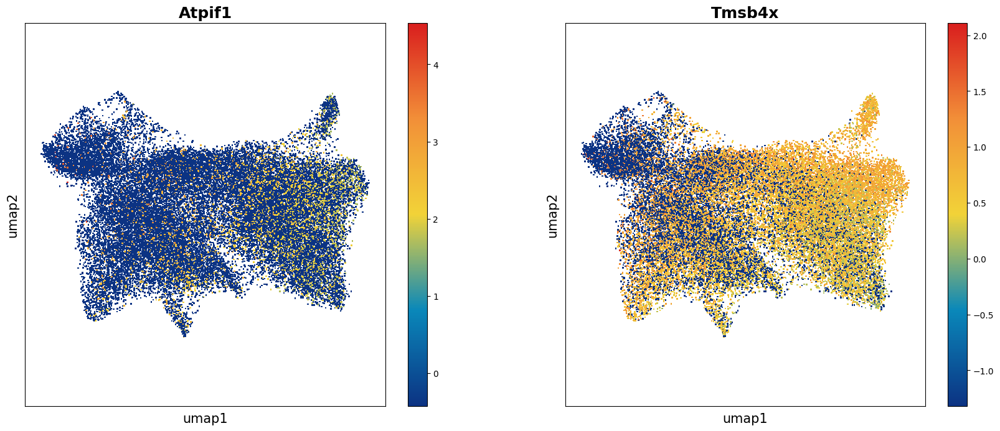

In [19]:
data.plt.umap(gene_names=['Atpif1', 'Tmsb4x'], res_key='umap')

## Clustering

Currently we provide three common clustering methods, including **Leiden**, **Louvain** and **Phenograph**.

In this tool, you can re-run the normalization method before clustering if the parameter `normalize_method`  is not None. Then by default, we perform PCA to reduce the dimensionalites of the new normalization result, and use top 30 pcs to run clustering. 

At this stage, we strongly recommend using leiden. 

#### Leiden 

Simply run:

In [20]:
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden')

[2023-06-02 10:37:33][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run leiden...
[2023-06-02 10:37:42][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: leiden end, consume time 8.6314s.


Show the spatial distribution of the Leiden clustering.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

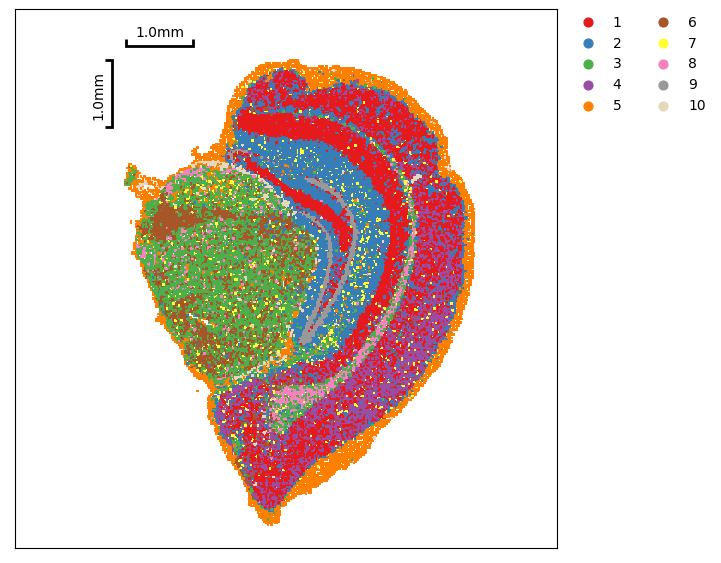

In [21]:
data.plt.cluster_scatter(res_key='leiden')

You also can just show partial clustering result.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

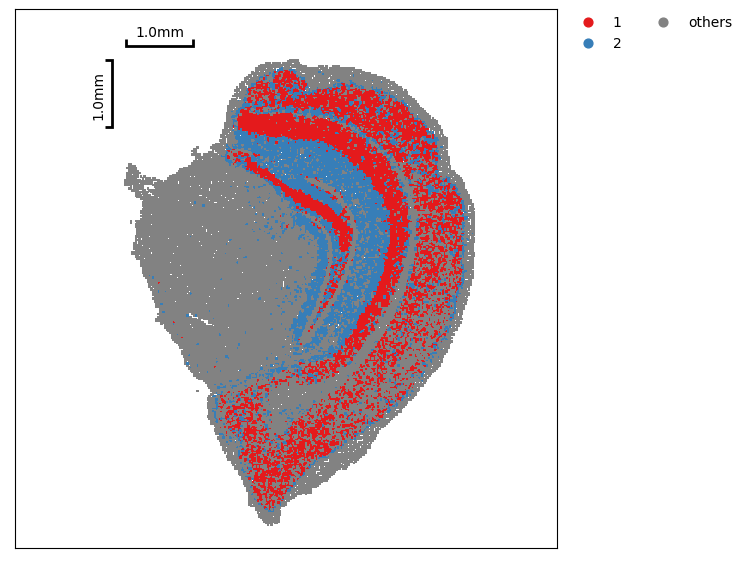

In [22]:
data.plt.cluster_scatter(res_key='leiden', groups=['1', '2'])

Show the distribution of the UMAP embedding.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

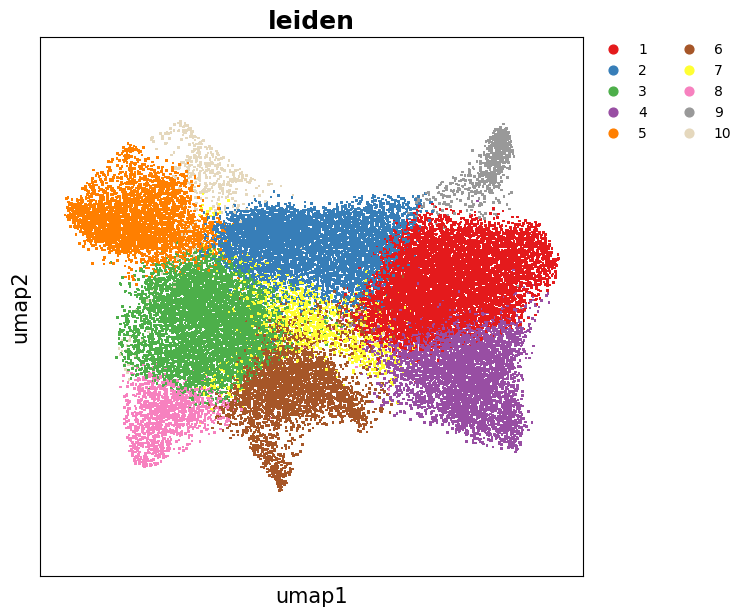

In [23]:
data.plt.umap(res_key='umap', cluster_key='leiden')

`data.plt.interact_cluster` generates an interact module from **Jupyter Notebook** and basic interactive manipulations could be done here. Simple clicks help you finish a series of operations, inclusing moving, tailoring, dyeing, saving and etc., over different clustering groups. More about in Interactive cluster.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
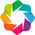

Row
    [0] ParamFunction(function)
    [1] Column
        [0] ColorPicker(name='background color', value='#ffffff', width=200)
        [1] IntSlider(end=200, name='dot size', start=1, value=1, width=200)
        [2] Select(name='color theme', options=['glasbey', 'glasbey_bw', ...], value='stereo_30', width=200)
        [3] Row
            [0] Select(name='cluster', options=['1', '2', '3', ...], value='1', width=100)
            [1] ColorPicker(name='node color', value='#E41A1C', width=70)

In [24]:
data.plt.interact_cluster(res_key='leiden')

The same way to display results of distribution, using spatial neighbors:

In [25]:
data.tl.leiden(neighbors_res_key='spatial_neighbors', res_key='spatial_leiden')

[2023-06-02 10:37:45][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run leiden...
[2023-06-02 10:38:03][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: leiden end, consume time 17.5266s.


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

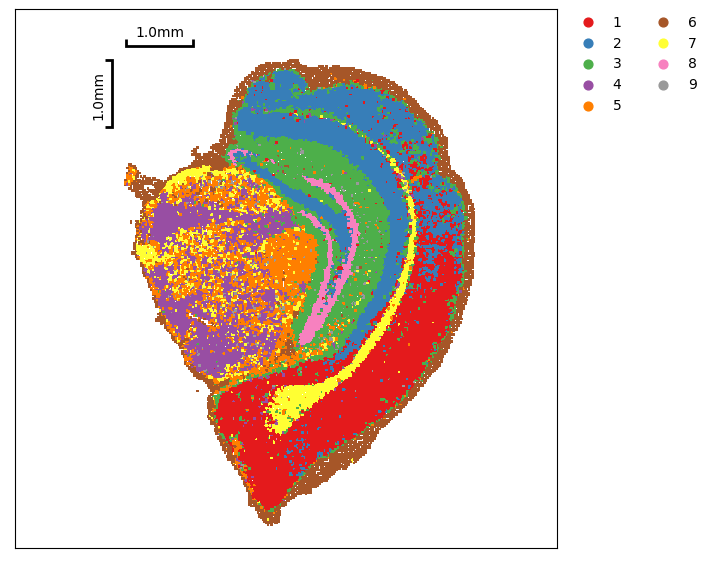

In [26]:
data.plt.cluster_scatter(res_key='spatial_leiden')

#### Louvain

When clustering by Louvain algorithm, just run:

In [27]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain')

[2023-06-02 10:38:03][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run louvain...
[2023-06-02 10:38:04][Stereo][22522][MainThread][139765435148096][_louvain][100][INFO]:     using the "louvain" package of Traag (2017)
[2023-06-02 10:38:07][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: louvain end, consume time 3.6651s.


Show the spatial distribution of Louvain clustering.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

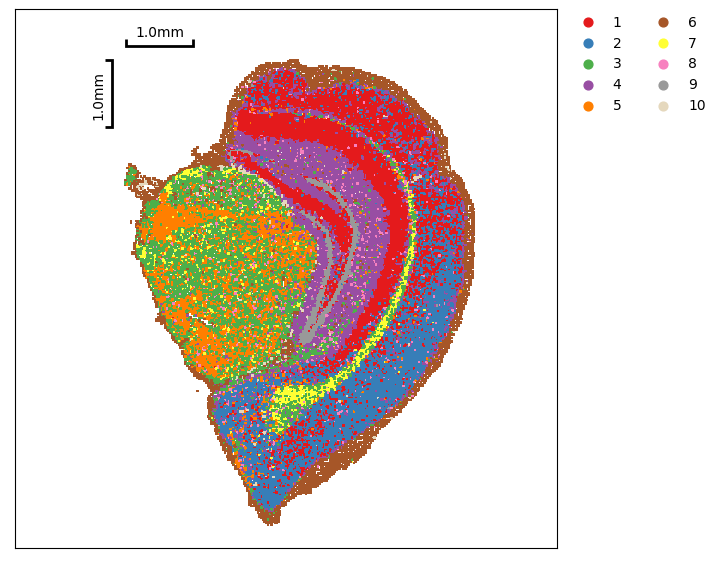

In [28]:
data.plt.cluster_scatter(res_key='louvain')

#### Phenograph

When clustering by Phenograph algorithm, just run:

In [29]:
data.tl.phenograph(phenograph_k=30, pca_res_key='pca', res_key='phenograph')

[2023-06-02 10:38:08][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run phenograph...


Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 47.25913095474243 seconds
Jaccard graph constructed in 15.003251075744629 seconds
Running Leiden optimization
Leiden completed in 11.621804475784302 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 84.00398421287537 seconds


[2023-06-02 10:39:32][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: phenograph end, consume time 84.4942s.


Show the spatial distribution of Phenograph clustering.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

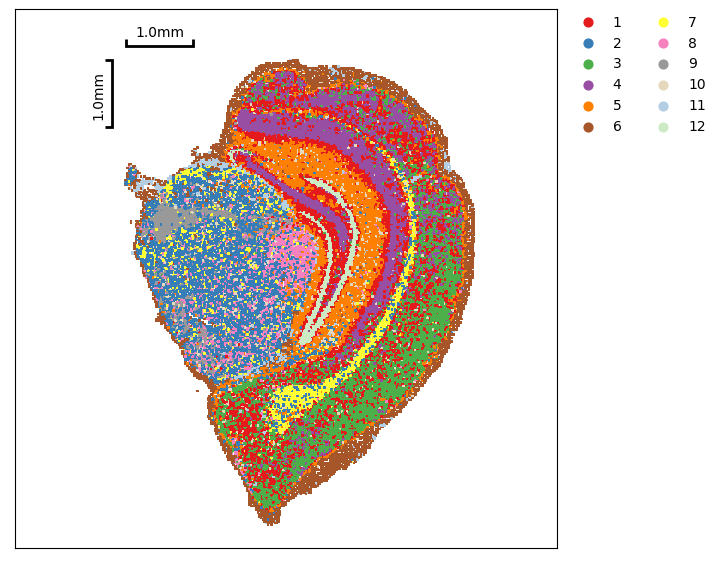

In [30]:
data.plt.cluster_scatter(res_key='phenograph')

##  Find Marker Genes

Hypothesis test is used to compute a ranking of differentially expressed genes among clusters. The raw count of express matrix which has been saved in `self.raw` by `data.tl.raw_checkpoint()` and highly variable genes are two optional data sets, used to find marker genes.

Here supports two methods, `t_test` and `wilcoxon_test`, to find marker genes between pairs among all clusters. T-test is a common and simple approach to do so.

In [31]:
data.tl.find_marker_genes(
        cluster_res_key='leiden', 
        method='t_test', 
        use_highly_genes=False, 
        use_raw=True
        )

[2023-06-02 10:39:33][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run find_marker_genes...
[2023-06-02 10:39:33][Stereo][22522][MainThread][139765435148096][tool_base][119][INFO]: read group information, grouping by group column.
[2023-06-02 10:39:33][Stereo][22522][MainThread][139765435148096][tool_base][157][INFO]: start to run...
[2023-06-02 10:39:33][Stereo][22522][MainThread][139765435148096][time_consume][55][INFO]: start to run calc_pct_and_pct_rest...
[2023-06-02 10:39:34][Stereo][22522][MainThread][139765435148096][time_consume][58][INFO]: calc_pct_and_pct_rest end, consume time 0.9488s.
Find marker gene: 100%|██████████| 10/10 [00:02<00:00,  3.86it/s]
[2023-06-02 10:39:36][Stereo][22522][MainThread][139765435148096][tool_base][159][INFO]: end to run.
[2023-06-02 10:39:36][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: find_marker_genes end, consume time 3.6258s.


Display the ranking and scores of top 10 marker genes in each group.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

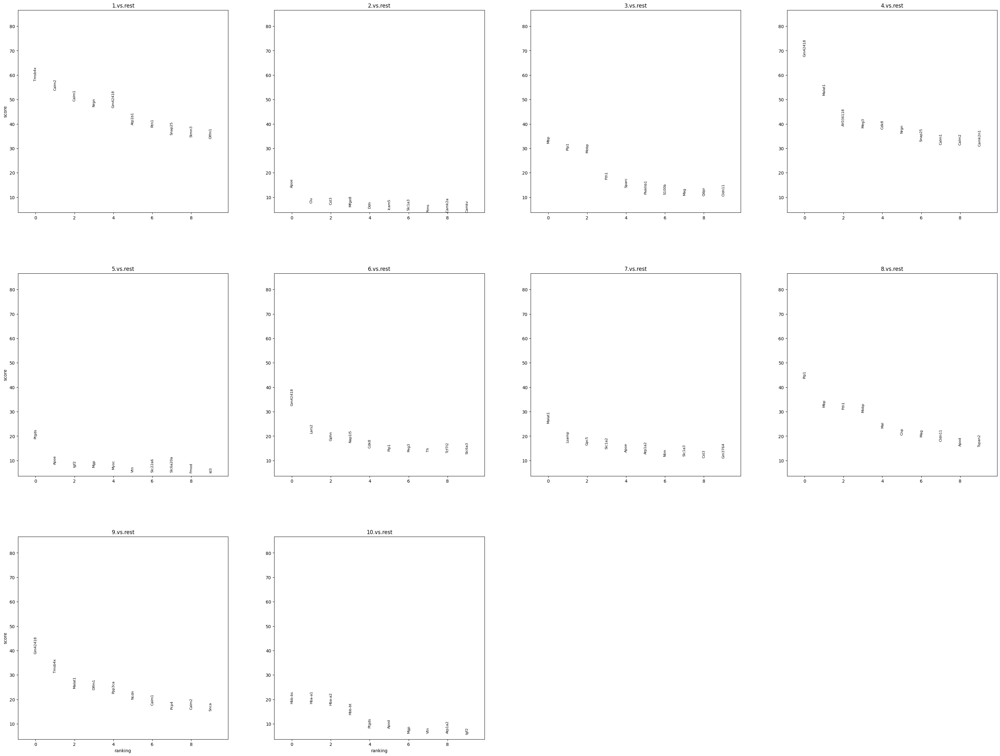

In [32]:
data.plt.marker_genes_text(
        res_key='marker_genes', 
        markers_num=10, 
        sort_key='scores'
        )

Display the scatter plot of top 5 marker genes in each group.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

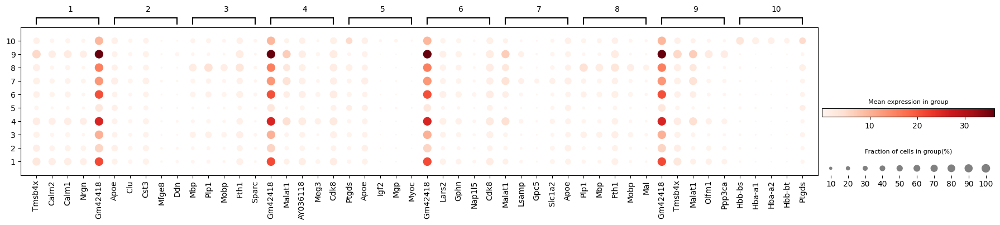

In [33]:
data.plt.marker_genes_scatter(res_key='marker_genes', markers_num=5)

Meanwhile, display the volcano plot of a specific group versus to the rest.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

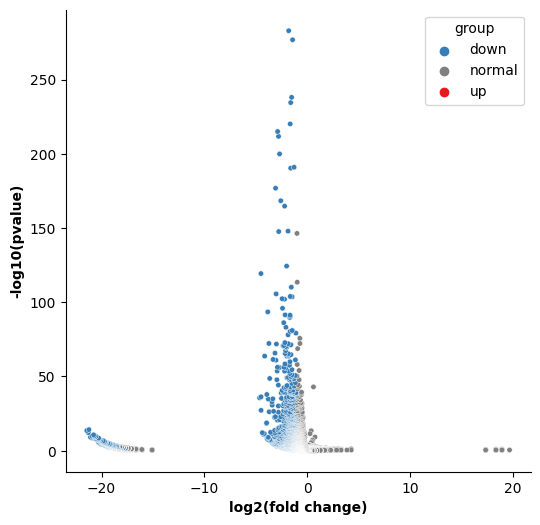

In [34]:
data.plt.marker_gene_volcano(group_name='2.vs.rest', vlines=False)

You can also filter out genes based on log fold change and fraction of genes expressing the gene within and outside each group.

In [35]:
data.tl.filter_marker_genes(
    marker_genes_res_key='marker_genes',
    min_fold_change=1,
    min_in_group_fraction=0.25,
    max_out_group_fraction=0.5,
    res_key='marker_genes_filtered'
)

[2023-06-02 10:39:43][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run filter_marker_genes...
[2023-06-02 10:39:44][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: filter_marker_genes end, consume time 0.6019s.


## Annotation

After finding marker genes, we can annotate clustering results by using `data.tl.annotation` or `data.plt.interact_annotation_cluster`.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
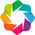

Row
    [0] ParamFunction(function)
    [1] Column
        [0] IntSlider(end=200, name='dot size', start=1, value=1, width=200)
        [1] Row
            [0] Select(name='cluster', options=['1', '2', '3', ...], value='1', width=100)
            [1] TextInput(name='annotation', width=100)
        [2] Button(name='Save annotation', width=200)
        [3] ParamFunction(function)

In [36]:
data.plt.interact_annotation_cluster(
            res_cluster_key='leiden', 
            res_marker_gene_key='marker_genes', 
            res_key='leiden_annotation'
            )

Use command lines to annotate clusters:

In [37]:
annotation_dict = {
    '1':'a',
    '2':'b',
    '3':'c',
    '4':'d',
    '5':'e',
    '6':'f',
    '7':'g',
    '8':'h',
    '9':'i',
    '10':'j',
    '11':'k',
    '12': 'l'
    }
data.tl.annotation(
        annotation_information=annotation_dict, 
        cluster_res_key='leiden', 
        res_key='anno_leiden'
        )

[2023-06-02 10:39:45][Stereo][22522][MainThread][139765435148096][st_pipeline][37][INFO]: start to run annotation...
[2023-06-02 10:39:45][Stereo][22522][MainThread][139765435148096][st_pipeline][40][INFO]: annotation end, consume time 0.3503s.


At the end, you could transform our data object to AnnData and save analysis results into an H5ad file.

In [38]:
adata = st.io.stereo_to_anndata(data,flavor='seurat',output='SS200000135TL_D1_seurat.h5ad')

[2023-06-02 10:39:53][Stereo][22522][MainThread][139765435148096][reader][654][INFO]: Adding sample in adata.obs['orig.ident'].
[2023-06-02 10:39:53][Stereo][22522][MainThread][139765435148096][reader][657][INFO]: Adding data.position as adata.obsm['spatial'] .
[2023-06-02 10:39:53][Stereo][22522][MainThread][139765435148096][reader][662][INFO]: Adding data.position as adata.obs['x'] and adata.obs['y'] .
[2023-06-02 10:39:53][Stereo][22522][MainThread][139765435148096][reader][681][INFO]: Adding data.tl.result['highly_variable_genes'] into adata.var .
[2023-06-02 10:39:53][Stereo][22522][MainThread][139765435148096][reader][702][INFO]: Adding data.tl.result['pca'] into adata.obsm['X_pca'] .
[2023-06-02 10:39:53][Stereo][22522][MainThread][139765435148096][reader][710][INFO]: Adding data.tl.result['neighbors']['connectivities'] into adata.obsp['connectivities'] .
[2023-06-02 10:39:53][Stereo][22522][MainThread][139765435148096][reader][711][INFO]: Adding data.tl.result['neighbors']['nn_

In [39]:
adata

AnnData object with n_obs × n_vars = 34780 × 20816
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'leiden', 'spatial_leiden', 'louvain', 'phenograph', 'anno_leiden', 'orig.ident', 'x', 'y'
    var: 'n_cells', 'n_counts', 'mean_umi', 'hvgs', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'gene type'
    uns: 'sn', 'hvg', 'neighbors', 'spatial_neighbors', 'gene_exp_cluster@gene_exp_leiden', 'gene_exp_cluster@gene_exp_spatial_leiden', 'gene_exp_cluster@gene_exp_louvain', 'gene_exp_cluster@gene_exp_phenograph', 'gene_exp_cluster@gene_exp_anno_leiden', 'raw_counts', 'raw_cellname', 'raw_genename'
    obsm: 'spatial', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances', 'spatial_neighbors_connectivities', 'spatial_neighbors_distances'